In [1]:
import pandas as pd
pd.set_option('display.max_rows', None, 'display.max_columns', None)
pd.set_option('precision', 2)
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker as plticker
import seaborn as sns
import matplotlib.lines as mlines
import matplotlib.transforms as mtransforms
%matplotlib inline
#sns.set(style="whitegrid", color_codes=True)
sns.set(style="ticks", color_codes=True)
plt.rcParams['figure.figsize'] = (8,5)
plt.rcParams['figure.dpi'] = 150

In [2]:
df=pd.read_excel('finished.xlsx') 
df.head()

,Order#,Item Number,Brand,Item,Sneaker Name,Size US,Retail Price,Purchased Price CNY,Purchased Price USD,Sales Price USD,Profit USD,Currency,Time Released,Release Date,Sold Date
0,781052659,CU1727-100,Nike,Dunk Low Retro SP 'St. John's',Nike Dunk Retro Be True St. John's,9.5,120,3032.51,470.20,420.73,-49.47,6.45,46,2016-07-01,2020-05-01
1,993696776,CP9652,Adidas Yeezy,Yeezy Boost 350 V2 'Bred',Adidas Yeezy Boost 350 V2 Black Red (2017/2020),8.0,220,2438.00,378.02,367.34,-10.68,6.45,43,2017-02-11,2020-09-29
2,145646199,CP9652,Adidas Yeezy,Yeezy Boost 350 V2 'Bred',Adidas Yeezy Boost 350 V2 Black Red (2017/2020),6.0,220,2438.00,377.79,341.09,-36.70,6.45,22,2017-02-11,2018-12-25
3,963418140,CP9652,Adidas Yeezy,350黑红字,Adidas Yeezy Boost 350 V2\nBlack Red (2017/2020),11.0,220,2438.00,379.51,384.10,4.59,6.42,36,2017-02-11,2020-03-02
4,481568090,CP9652,Adidas Yeezy,350黑红字,Adidas Yeezy Boost 350 V2\nBlack Red (2017/2020),10.0,220,2438.00,379.51,373.24,-6.27,6.42,15,2017-02-11,2018-05-29


In [3]:
#Dataframe Info

df.info()

df.isnull().sum()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7641 entries, 0 to 7640
Data columns (total 15 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   Order#               7641 non-null   int64         
 1   Item Number          7641 non-null   object        
 2   Brand                7641 non-null   object        
 3   Item                 7641 non-null   object        
 4   Sneaker Name         7641 non-null   object        
 5   Size US              7641 non-null   float64       
 6   Retail Price         7641 non-null   int64         
 7   Purchased Price CNY  7641 non-null   float64       
 8   Purchased Price USD  7641 non-null   float64       
 9   Sales Price USD      7641 non-null   float64       
 10  Profit USD           7641 non-null   float64       
 11  Currency             7641 non-null   float64       
 12  Time Released        7641 non-null   int64         
 13  Release Date         7641 non-nul

Order#                 0
Item Number            0
Brand                  0
Item                   0
Sneaker Name           0
Size US                0
Retail Price           0
Purchased Price CNY    0
Purchased Price USD    0
Sales Price USD        0
Profit USD             0
Currency               0
Time Released          0
Release Date           0
Sold Date              0
dtype: int64

In [4]:
# Remove - in sneaker name 
df['Sneaker Name'] = df['Sneaker Name'].apply(lambda x: x.replace('-', ' '))
df['Brand'] = df['Brand'].apply(lambda x: x.replace('-', ' '))
#adjust data types
#Release Date and Order Date -> datetime
df['Release Date'] = pd.to_datetime(df['Release Date'])
df['Sold Date'] = pd.to_datetime(df['Sold Date'])

In [5]:
#Create two additional columns: Time Released, and Profit
#df['Retail Profit'] = (df['Sales Price USD'] - df['Retail Price'])
df['Time Released'] = ((df['Sold Date'] - df['Release Date'])/ np.timedelta64(1, 'M')).astype(int)
df.head()

,Order#,Item Number,Brand,Item,Sneaker Name,Size US,Retail Price,Purchased Price CNY,Purchased Price USD,Sales Price USD,Profit USD,Currency,Time Released,Release Date,Sold Date
0,781052659,CU1727-100,Nike,Dunk Low Retro SP 'St. John's',Nike Dunk Retro Be True St. John's,9.5,120,3032.51,470.20,420.73,-49.47,6.45,45,2016-07-01,2020-05-01
1,993696776,CP9652,Adidas Yeezy,Yeezy Boost 350 V2 'Bred',Adidas Yeezy Boost 350 V2 Black Red (2017/2020),8.0,220,2438.00,378.02,367.34,-10.68,6.45,43,2017-02-11,2020-09-29
2,145646199,CP9652,Adidas Yeezy,Yeezy Boost 350 V2 'Bred',Adidas Yeezy Boost 350 V2 Black Red (2017/2020),6.0,220,2438.00,377.79,341.09,-36.70,6.45,22,2017-02-11,2018-12-25
3,963418140,CP9652,Adidas Yeezy,350黑红字,Adidas Yeezy Boost 350 V2\nBlack Red (2017/2020),11.0,220,2438.00,379.51,384.10,4.59,6.42,36,2017-02-11,2020-03-02
4,481568090,CP9652,Adidas Yeezy,350黑红字,Adidas Yeezy Boost 350 V2\nBlack Red (2017/2020),10.0,220,2438.00,379.51,373.24,-6.27,6.42,15,2017-02-11,2018-05-29


In [6]:
df['Retail Price'] = df['Retail Price'].astype(float)
df['Time Released'] = df['Time Released'].astype(float)
df['Size US'] = pd.Categorical(df['Size US'])

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7641 entries, 0 to 7640
Data columns (total 15 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   Order#               7641 non-null   int64         
 1   Item Number          7641 non-null   object        
 2   Brand                7641 non-null   object        
 3   Item                 7641 non-null   object        
 4   Sneaker Name         7641 non-null   object        
 5   Size US              7641 non-null   category      
 6   Retail Price         7641 non-null   float64       
 7   Purchased Price CNY  7641 non-null   float64       
 8   Purchased Price USD  7641 non-null   float64       
 9   Sales Price USD      7641 non-null   float64       
 10  Profit USD           7641 non-null   float64       
 11  Currency             7641 non-null   float64       
 12  Time Released        7641 non-null   float64       
 13  Release Date         7641 non-nul

In [7]:
# Drop features 
df.drop('Order#', axis=1, inplace=True)
df.drop('Currency',axis=1, inplace=True)
df.drop('Purchased Price CNY',axis=1, inplace=True)
df.describe()

,Retail Price,Purchased Price USD,Sales Price USD,Profit USD,Time Released
count,7641.00,7641.00,7641.00,7641.00,7641.00
mean,117.05,172.72,188.52,15.80,3.88
std,58.74,81.21,81.87,32.28,3.90
min,35.00,58.89,63.97,-375.10,0.00
25%,60.00,120.08,132.94,8.75,1.00
50%,100.00,151.60,164.62,15.62,3.00
75%,170.00,203.46,216.92,25.39,5.00
max,250.00,930.25,658.75,299.16,49.00


In [8]:
elements = np.array(df['Profit USD'])
mean = np.mean(elements, axis=0)
sd = np.std(elements, axis=0)
final_list = [x for x in df['Profit USD'] if (x < mean - 3 * sd)]
final_list = [x for x in df['Profit USD'] if (x > mean - 3 * sd)]
len(final_list)

7499

In [9]:
from scipy import stats
ol=df[(np.abs(stats.zscore(df['Profit USD'])) < 3)]
ol

,Item Number,Brand,Item,Sneaker Name,Size US,Retail Price,Purchased Price USD,Sales Price USD,Profit USD,Time Released,Release Date,Sold Date
0,CU1727-100,Nike,Dunk Low Retro SP 'St. John's',Nike Dunk Retro Be True St. John's,9.5,120.0,470.20,420.73,-49.47,45.0,2016-07-01,2020-05-01
1,CP9652,Adidas Yeezy,Yeezy Boost 350 V2 'Bred',Adidas Yeezy Boost 350 V2 Black Red (2017/2020),8.0,220.0,378.02,367.34,-10.68,43.0,2017-02-11,2020-09-29
2,CP9652,Adidas Yeezy,Yeezy Boost 350 V2 'Bred',Adidas Yeezy Boost 350 V2 Black Red (2017/2020),6.0,220.0,377.79,341.09,-36.70,22.0,2017-02-11,2018-12-25
3,CP9652,Adidas Yeezy,350黑红字,Adidas Yeezy Boost 350 V2\nBlack Red (2017/2020),11.0,220.0,379.51,384.10,4.59,36.0,2017-02-11,2020-03-02
4,CP9652,Adidas Yeezy,350黑红字,Adidas Yeezy Boost 350 V2\nBlack Red (2017/2020),10.0,220.0,379.51,373.24,-6.27,15.0,2017-02-11,2018-05-29
5,CP9652,Adidas Yeezy,350黑红字,Adidas Yeezy Boost 350 V2\nBlack Red (2017/2020),10.0,220.0,379.51,373.24,-6.27,49.0,2017-02-11,2021-03-28
6,555088-035,Jordan,Aj1 High Shadow,Jordan 1 Retro High Shadow (2018),10.5,170.0,205.33,238.40,33.07,32.0,2018-04-14,2021-01-05
7,555088-035,Jordan,Aj1 High Shadow,Jordan 1 Retro High Shadow (2018),9.5,170.0,205.33,238.40,33.07,40.0,2018-04-14,2021-09-09
8,555088-035,Jordan,Aj1 High Shadow,Jordan 1 Retro High Shadow (2018),9.5,170.0,206.57,238.40,31.83,44.0,2018-04-14,2021-12-21
9,555088-035,Jordan,Aj1 High Shadow,Jordan 1 Retro High Shadow (2018),9.0,170.0,205.33,237.49,32.16,12.0,2018-04-14,2019-04-19


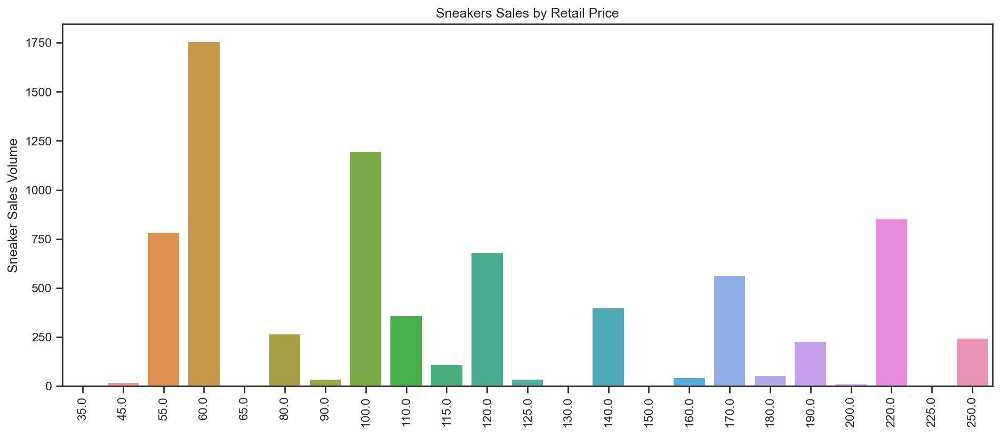

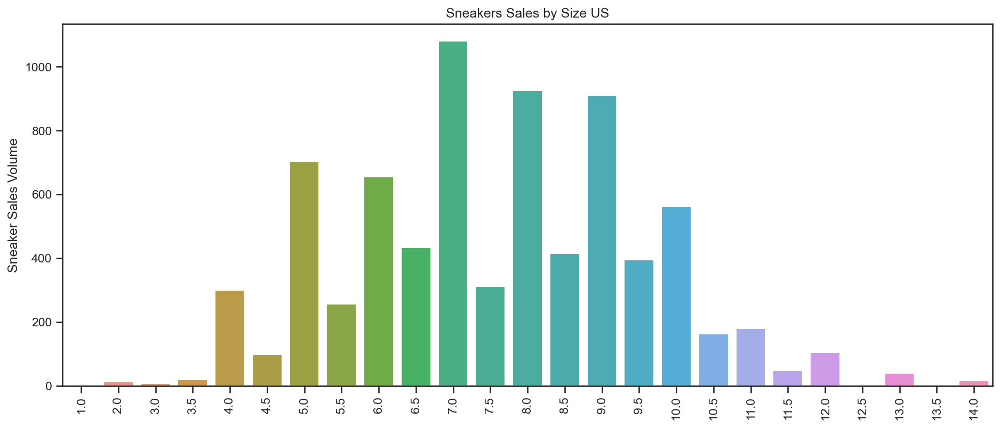

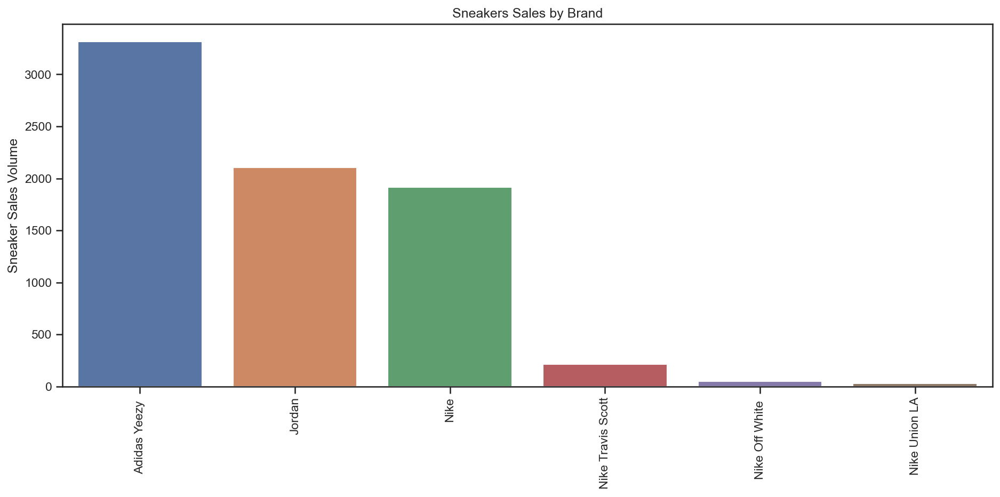

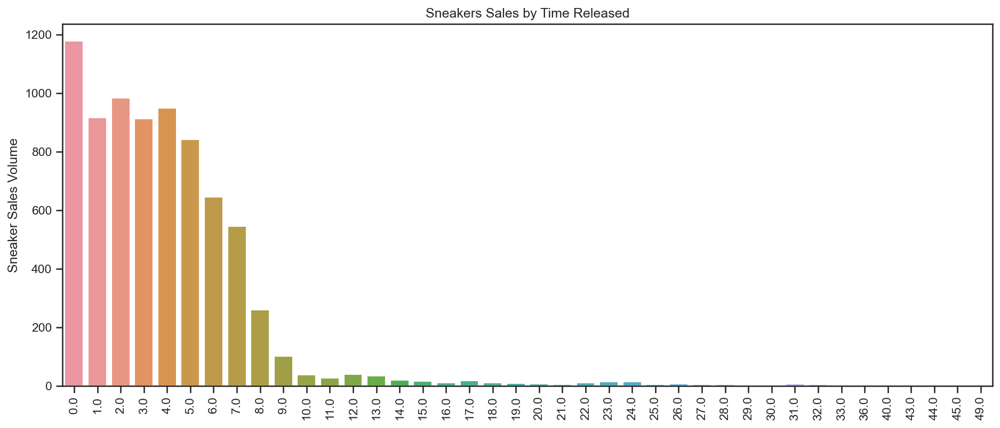

In [10]:
# A combine visualizations on variables in the Dataframe
df_mix = ['Retail Price', 'Size US','Brand','Time Released' ]
for mix in df_mix:
    mix_num = df[str(mix)].value_counts()
    plt.figure(figsize=(15,6))
    chart = sns.barplot(x = mix_num.index, y= mix_num)
    chart.set_title("Sneakers Sales by %s" % (mix))
    plt.ylabel("Sneaker Sales Volume")
    chart.set_xticklabels(chart.get_xticklabels(), rotation = 90)
    plt.gca().xaxis.set_major_locator(plt.MultipleLocator(1))
    plt.show(15)

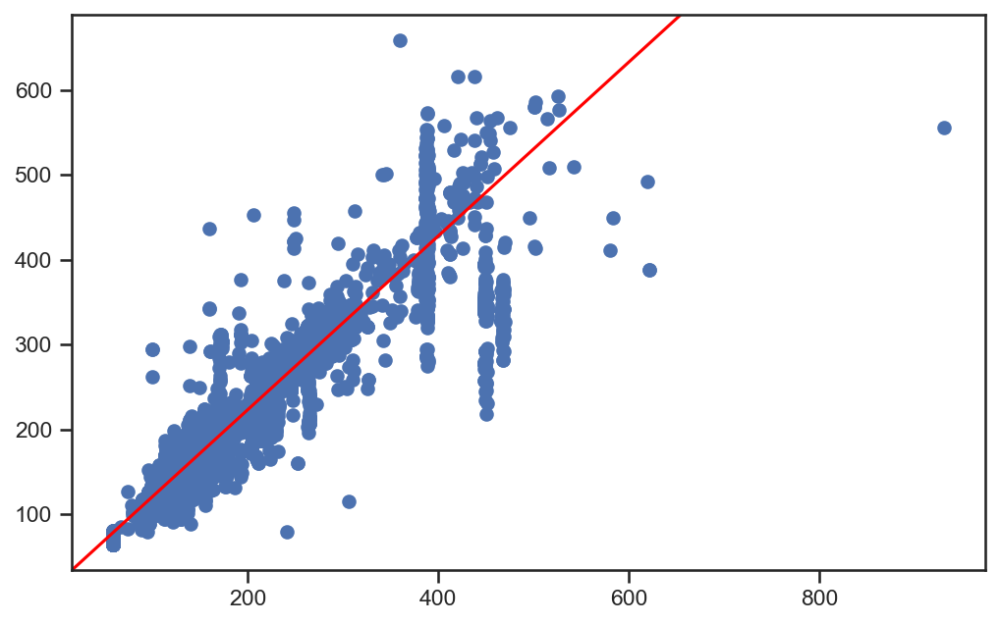

In [11]:
x = df['Purchased Price USD']
y = df['Sales Price USD']

fig, ax = plt.subplots()
ax.scatter(x, y)
line = mlines.Line2D([0, 2/3], [0, 1], color='red')
transform = ax.transAxes
line.set_transform(transform)
ax.add_line(line)
plt.show()

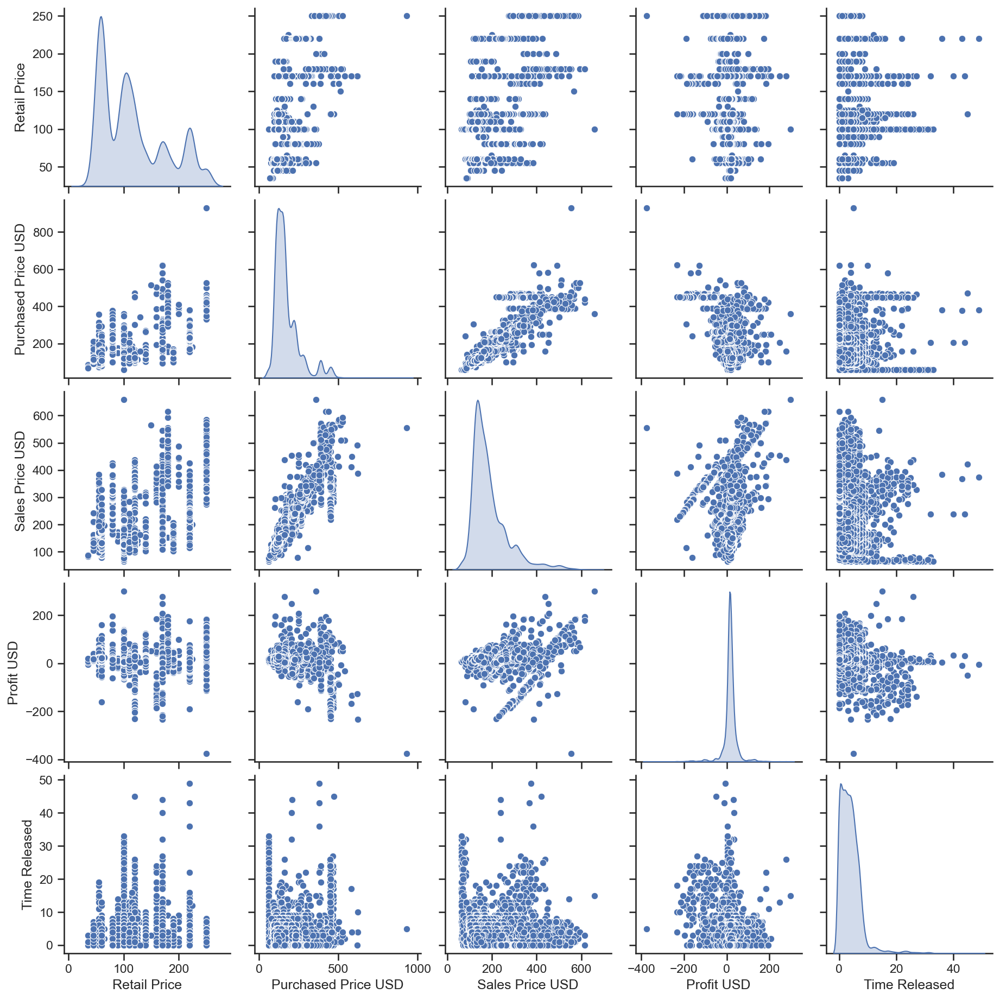

In [12]:
#All variables
sns.pairplot(df,diag_kind='kde')

In [13]:
#Correlation 
#corr = df.corr(method = 'kendall')
#corr
# Create correlation matrix
corr_matrix = df.corr().abs()

# Select upper triangle of correlation matrix
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(np.bool))


df.corr()

,Retail Price,Purchased Price USD,Sales Price USD,Profit USD,Time Released
Retail Price,1.00,0.45,0.48,0.07,0.02
Purchased Price USD,0.45,1.00,0.92,-0.18,0.11
Sales Price USD,0.48,0.92,1.00,0.22,0.02
Profit USD,0.07,-0.18,0.22,1.00,-0.22
Time Released,0.02,0.11,0.02,-0.22,1.00


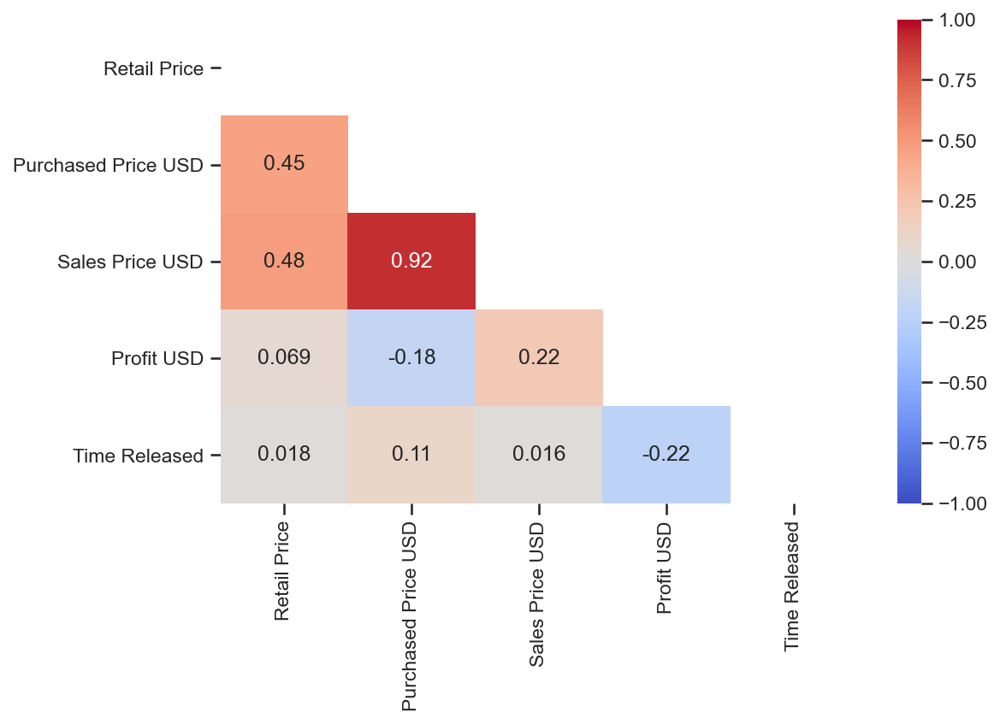

In [14]:
# show heat map of the correlation
upp_mat = np.triu(df.corr())
sns.heatmap(df.corr(), vmin=-1,vmax=+1, annot=True, cmap='coolwarm', mask = upp_mat)
plt.show()

In [15]:
tsneakernames=df['Sneaker Name'].value_counts().index.tolist()
tsnkr = df[['Sneaker Name','Profit USD','Purchased Price USD']]

tpavgs=[]
tsums = []
tcounts =[]
tavgs=[]
for name in tsneakernames:
    shoerow = tsnkr.loc[tsnkr['Sneaker Name'] == name]
    tpavgs.append(shoerow.mean()[1])
    tavgs.append(shoerow.mean()[0])
    tsums.append(shoerow.sum()[1])
    tcounts.append(shoerow.count()[0])
AvgPricet = pd.Series(tpavgs)
AvgProfitt = pd.Series(tavgs) 
SumProfitt = pd.Series(tsums)
tSneakerName = pd.Series(tsneakernames)
tCountName = pd.Series(tcounts)
profit_total = pd.DataFrame(columns = ['Sneaker_Name','Avg_Profit','Avg_Profit','Sum_Profit','Count'])
profit_total['Sneaker_Name'] = tSneakerName
profit_total['Avg_Price']=AvgPricet
profit_total['Avg_Profit'] = AvgProfitt
profit_total['Sum_Profit'] = SumProfitt
profit_total['Count'] = tCountName

In [21]:
len(df['Sneaker Name'].unique())

143

In [84]:
profit_total

,Sneaker_Name,Avg_Profit,Avg_Profit,Sum_Profit,Count,Avg_Price
0,Adidas Yeezy Slide Pure (First Release),18.42,18.42,16487.17,895,154.53
1,Adidas Yeezy Slide Resin,12.96,12.96,7814.45,603,130.66
2,Jordan 5 Retro Raging Bull Red (2021),18.15,18.15,7043.63,388,146.54
3,Nike Air Force 1 Low LX UV Reactive (W),17.45,17.45,6684.04,383,111.26
4,adidas Yeezy Slide Pure (First Release),15.53,15.53,5248.02,338,147.77
5,Jordan 6 Retro Carmine 2021 (GS),17.02,17.02,3658.90,215,112.43
6,Adidas Yeezy Boost 350 V2 Mono Cinder,19.04,19.04,4075.56,214,217.67
7,Jordan 6 Retro Travis Scott British Khaki,46.74,46.74,9534.29,204,388.40
8,adidas Yeezy Boost 350 V2 Mono Cinder,20.47,20.47,3971.11,194,225.08
9,Nike Dunk Low SE Easter Candy (W),15.31,15.31,2955.19,193,99.21


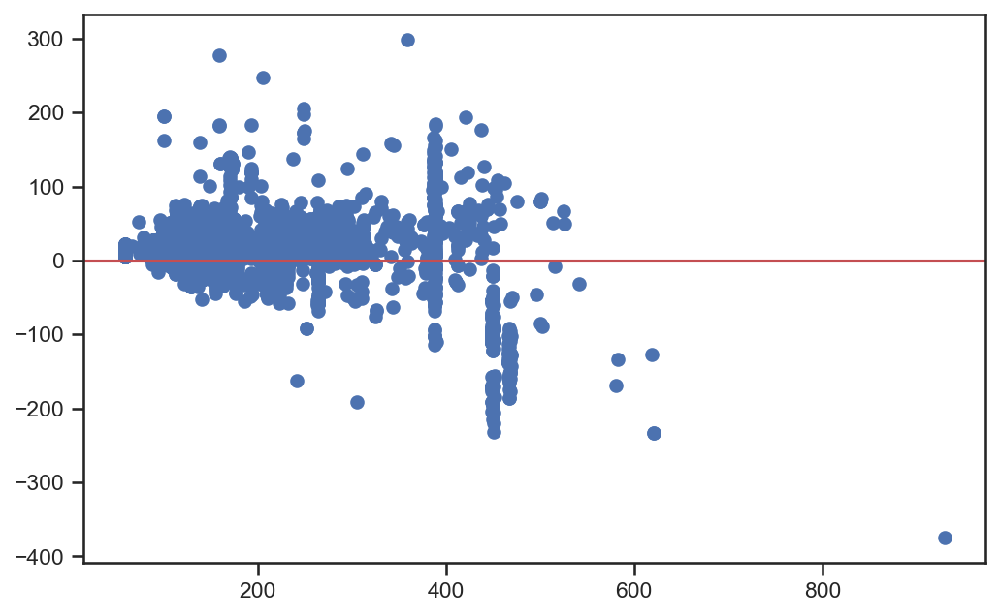

In [85]:
x = df['Purchased Price USD']
y = df['Profit USD']

fig, ax = plt.subplots()
ax.scatter(x, y)
plt.axhline(y=0, color='r', linestyle='-')
plt.show()

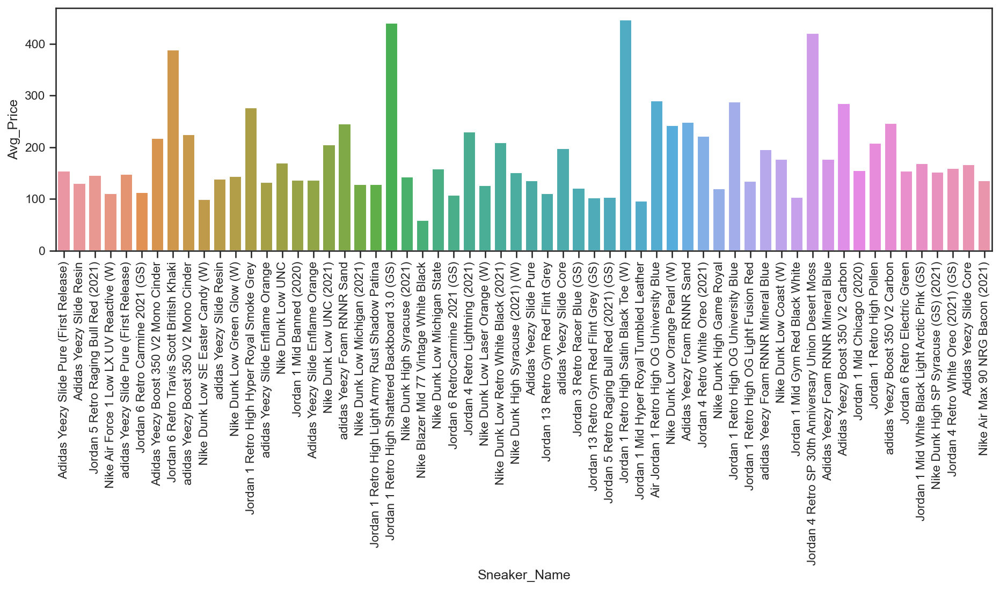

In [86]:
# Creating visual of average shoe price
fig_dims = (15, 4)
fig, ax = plt.subplots(figsize=fig_dims)
chart = sns.barplot(x = profit_total['Sneaker_Name'][:60] , y= profit_total['Avg_Price'])
chart.set_xticklabels(chart.get_xticklabels(), rotation = 90)
plt.gca().xaxis.set_major_locator(plt.MultipleLocator(1))

In [87]:
#proportational profitable transaction 
gain=df[(df['Profit USD']>0)]
gsneakernames=gain['Sneaker Name'].value_counts().index.tolist()
gain.describe()

,Retail Price,Purchased Price USD,Sales Price USD,Profit USD,Time Released
count,6705.00,6705.00,6705.00,6705.00,6705.00
mean,115.46,163.82,186.71,22.89,3.58
std,59.02,68.12,79.94,21.74,3.43
min,35.00,58.89,63.97,0.02,0.00
25%,60.00,113.52,133.85,11.94,1.00
50%,100.00,149.20,165.33,17.53,3.00
75%,170.00,186.05,211.25,26.65,5.00
max,250.00,526.14,658.75,299.16,44.00


In [88]:
gsnkr = gain[['Sneaker Name','Profit USD','Purchased Price USD']]

gpavgs=[]
gsums = []
gcounts =[]
gavgs=[]
for name in gsneakernames:
    shoerow = gsnkr.loc[gsnkr['Sneaker Name'] == name]
    gpavgs.append(shoerow.mean()[1])
    gavgs.append(shoerow.mean()[0])
    gsums.append(shoerow.sum()[1])
    gcounts.append(shoerow.count()[0])
AvgPriceg = pd.Series(gpavgs)
AvgGain = pd.Series(gavgs) 
SumGain = pd.Series(gsums)
gSneakerName = pd.Series(gsneakernames)
gCountName = pd.Series(gcounts)
profit_gain = pd.DataFrame(columns = ['Sneaker_Name','Avg_Price','Avg_Gain','Sum_Gain','Count'])
profit_gain['Sneaker_Name'] = gSneakerName
profit_gain['Avg_Price']=AvgPriceg
profit_gain['Avg_Gain'] = AvgGain
profit_gain['Sum_Gain'] = SumGain
profit_gain['Count'] = gCountName

In [89]:
profit_gain

,Sneaker_Name,Avg_Price,Avg_Gain,Sum_Gain,Count
0,Adidas Yeezy Slide Pure (First Release),154.48,19.99,16952.02,848
1,Adidas Yeezy Slide Resin,128.68,16.56,8794.00,531
2,Nike Air Force 1 Low LX UV Reactive (W),111.26,17.45,6684.04,383
3,Jordan 5 Retro Raging Bull Red (2021),145.30,21.22,7488.93,353
4,adidas Yeezy Slide Pure (First Release),147.50,15.90,5295.10,333
5,Jordan 6 Retro Carmine 2021 (GS),112.43,17.02,3658.90,215
6,Nike Dunk Low SE Easter Candy (W),99.21,15.31,2955.19,193
7,Adidas Yeezy Boost 350 V2 Mono Cinder,217.93,23.20,4454.69,192
8,adidas Yeezy Boost 350 V2 Mono Cinder,225.05,22.75,4163.53,183
9,adidas Yeezy Slide Resin,136.47,12.91,2245.97,174


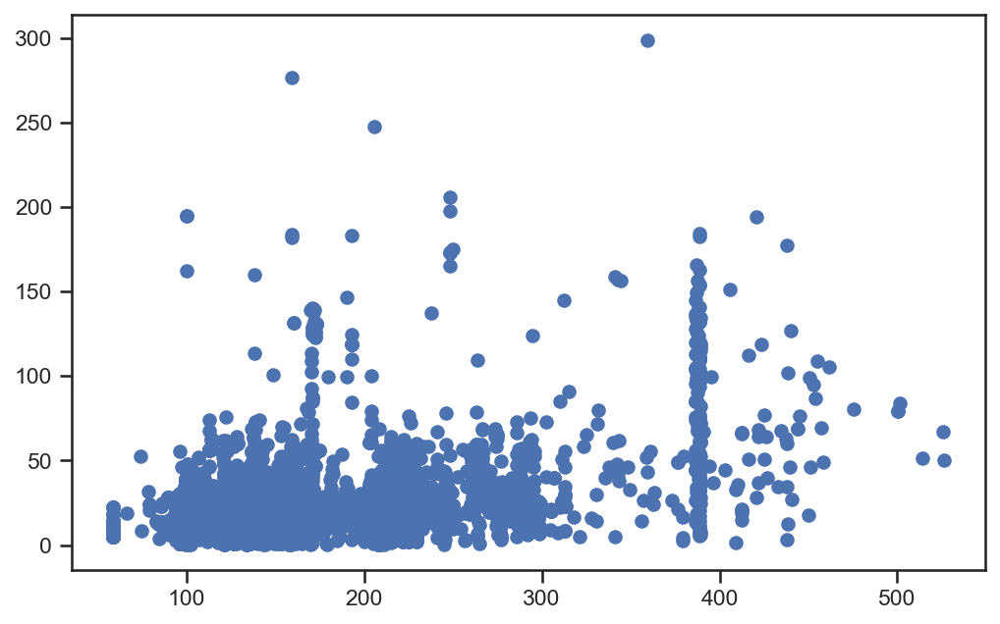

In [90]:
x = gain['Purchased Price USD']
y = gain['Profit USD']

fig, ax = plt.subplots()
ax.scatter(x, y)
plt.show()

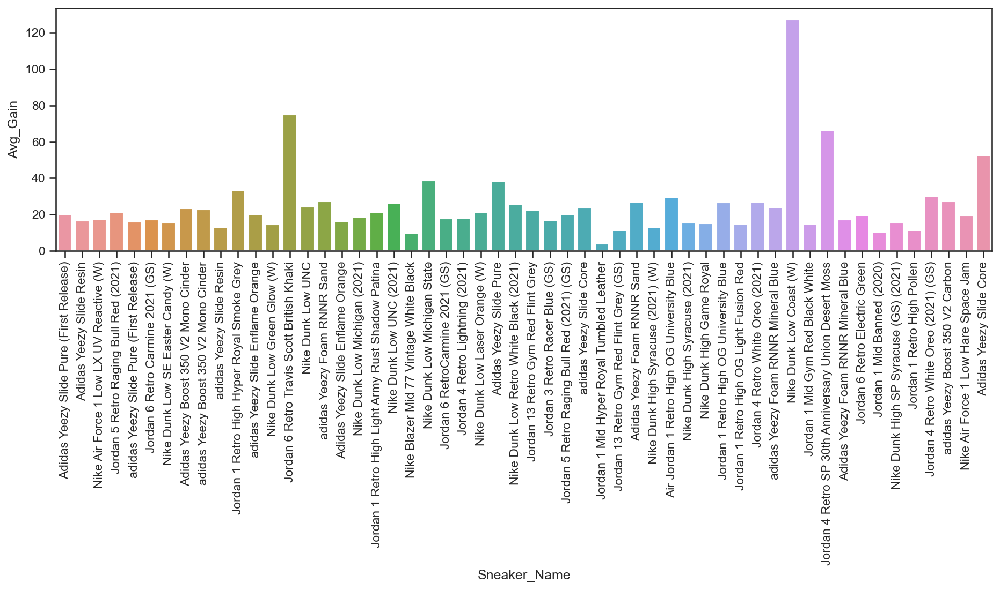

In [91]:
# Creating visual of average shoe price
fig_dims = (15, 4)
fig, ax = plt.subplots(figsize=fig_dims)
chart = sns.barplot(x = profit_gain['Sneaker_Name'][:54] , y= profit_gain['Avg_Gain'])
chart.set_xticklabels(chart.get_xticklabels(), rotation = 90)
plt.gca().xaxis.set_major_locator(plt.MultipleLocator(1))

In [44]:
loss=df[(df['Profit USD'] < 0)]
lsneakernames=loss['Sneaker Name'].value_counts().index.tolist()
loss.describe()

,Retail Price,Purchased Price USD,Sales Price USD,Profit USD,Time Released
count,936.00,936.00,936.00,936.00,936.00
mean,128.43,236.45,201.48,-34.96,6.00
std,55.40,126.43,93.61,46.75,5.91
min,35.00,88.03,79.36,-375.10,0.00
25%,100.00,141.80,131.61,-41.87,2.00
50%,115.00,170.05,158.28,-16.62,5.00
75%,162.50,325.37,274.35,-6.52,8.00
max,250.00,930.25,555.15,-0.05,49.00


In [45]:
lsnkr = loss[['Sneaker Name', 'Profit USD','Purchased Price USD']]

lpavgs = []
lsums = []
lcounts =[]
lavgs=[]
for name in lsneakernames:
    shoerow = lsnkr.loc[lsnkr['Sneaker Name'] == name]
    lpavgs.append(shoerow.mean()[1])
    lavgs.append(shoerow.mean()[0])
    lsums.append(shoerow.sum()[1])
    lcounts.append(shoerow.count()[0])
AvgPricel = pd.Series(lpavgs)
AvgLoss = pd.Series(lavgs) 
SumLoss = pd.Series(lsums)
lSneakerName = pd.Series(lsneakernames)
lCountName = pd.Series(lcounts)
profit_loss = pd.DataFrame(columns = ['Sneaker_Name','Avg_Price','Avg_Loss','Sum_Loss','Count'])
profit_loss['Sneaker_Name'] = lSneakerName
profit_loss['Avg_Price']= AvgPricel
profit_loss['Avg_Loss'] = AvgLoss
profit_loss['Sum_Loss'] = SumLoss
profit_loss['Count'] = lCountName

In [46]:
profit_loss

,Sneaker_Name,Avg_Price,Avg_Loss,Sum_Loss,Count
0,Jordan 1 Mid Banned (2020),139.38,-10.27,-1273.53,124
1,Jordan 1 Retro High Shattered Backboard 3.0 (GS),449.15,-113.27,-11780.00,104
2,Adidas Yeezy Slide Resin,145.26,-13.60,-979.55,72
3,Nike Dunk High Syracuse (2021),151.68,-15.08,-950.13,63
4,Jordan 1 Retro High Satin Black Toe (W),465.26,-128.01,-6016.25,47
5,Adidas Yeezy Slide Pure (First Release),155.29,-9.89,-464.85,47
6,Jordan 6 Retro Travis Scott British Khaki,388.21,-47.61,-2237.82,47
7,Nike Dunk Low UNC (2021),204.13,-22.69,-907.57,40
8,Jordan 5 Retro Raging Bull Red (2021),159.10,-12.72,-445.30,35
9,Nike Dunk Low Orange Pearl (W),264.32,-44.94,-1438.17,32


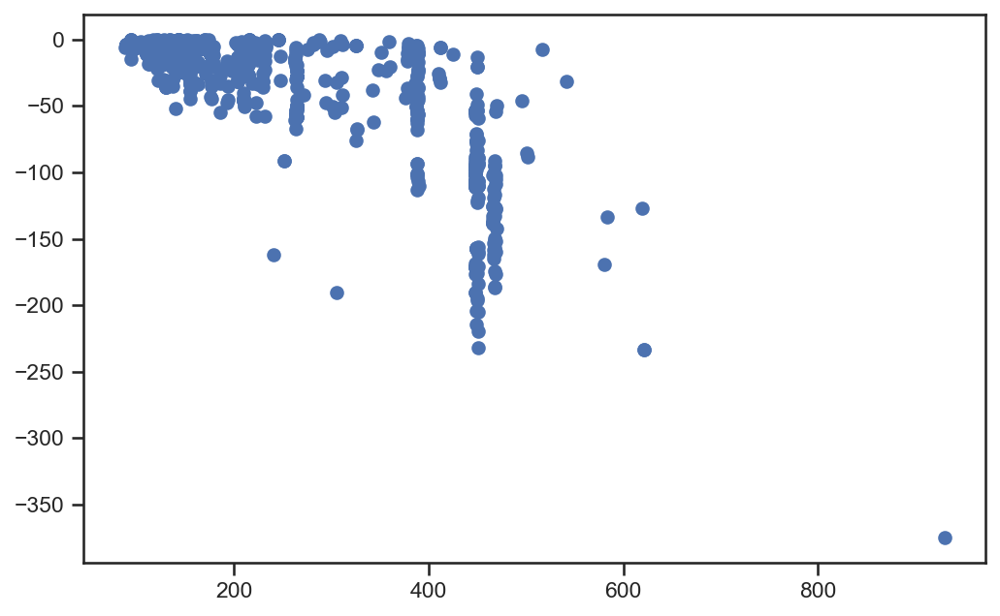

In [47]:
x = loss['Purchased Price USD']
y = loss['Profit USD']

fig, ax = plt.subplots()
ax.scatter(x, y)
plt.show()

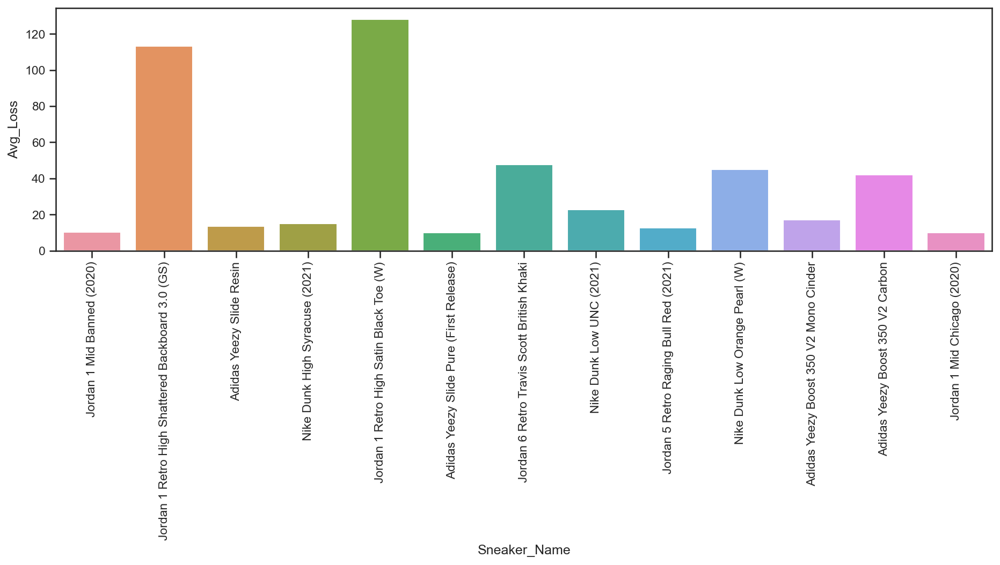

In [48]:
# Analyze trend between Sneaker Name & Sale price
# Create average retail price df

# Creating visual of average shoe price
fig_dims = (15, 4)
fig, ax = plt.subplots(figsize=fig_dims)
chart = sns.barplot(x = profit_loss['Sneaker_Name'][:13] , y = -profit_loss['Avg_Loss'])
chart.set_xticklabels(chart.get_xticklabels(), rotation = 90)
plt.gca().xaxis.set_major_locator(plt.MultipleLocator(1))

In [49]:
common_elements = np.intersect1d(gsneakernames, lsneakernames)
len(common_elements)

60

In [50]:
csnkr = df[['Sneaker Name', 'Profit USD','Purchased Price USD']]
csums = []
cavgs=[]
cprice = []
#cretail=[]
#size=[]
#time=[]
ccounts =[]
for name in common_elements:
    shoerow = csnkr.loc[csnkr['Sneaker Name'] == name]
    cprice.append(shoerow.mean()[1])
    cavgs.append(shoerow.mean()[0])
    csums.append(shoerow.sum()[1])
    #cretail.append(shoerow.mean()[2])
    #size.append(shoerow.mean()[3])
    #time.append(shoerow.mean()[4])
    ccounts.append(shoerow.count()[0])
AvgPrice=pd.Series(cprice)
AvgProfit = pd.Series(cavgs) 
SumProfit = pd.Series(csums)
SneakerName = pd.Series(common_elements)
cCountName = pd.Series(ccounts)
#retail=pd.Series(cretail)
#size=pd.Series(size)
#time=pd.Series(time)
profit = pd.DataFrame(columns = ['Sneaker_Name','Avg_Price','Avg_Profit','Sum_Profit','Count'])
profit['Sneaker_Name'] = SneakerName
profit['Avg_Price'] = cprice
profit['Avg_Profit'] = AvgProfit
profit['Sum_Profit'] = SumProfit
#profit['Retail']=retail
#profit['Size']=size
#profit['Time']=time
profit['Count'] = cCountName

profit=profit.sort_values(by='Count', ascending=False)
profit

,Sneaker_Name,Avg_Price,Avg_Profit,Sum_Profit,Count
8,Adidas Yeezy Slide Pure (First Release),154.53,18.42,16487.17,895
9,Adidas Yeezy Slide Resin,130.66,12.96,7814.45,603
33,Jordan 5 Retro Raging Bull Red (2021),146.54,18.15,7043.63,388
58,adidas Yeezy Slide Pure (First Release),147.77,15.53,5248.02,338
3,Adidas Yeezy Boost 350 V2 Mono Cinder,217.67,19.04,4075.56,214
36,Jordan 6 Retro Travis Scott British Khaki,388.40,46.74,9534.29,204
53,adidas Yeezy Boost 350 V2 Mono Cinder,225.08,20.47,3971.11,194
59,adidas Yeezy Slide Resin,138.37,10.67,2059.70,193
43,Nike Dunk Low Green Glow (W),143.69,13.49,2319.52,172
18,Jordan 1 Retro High Hyper Royal Smoke Grey,276.43,32.55,5598.43,172


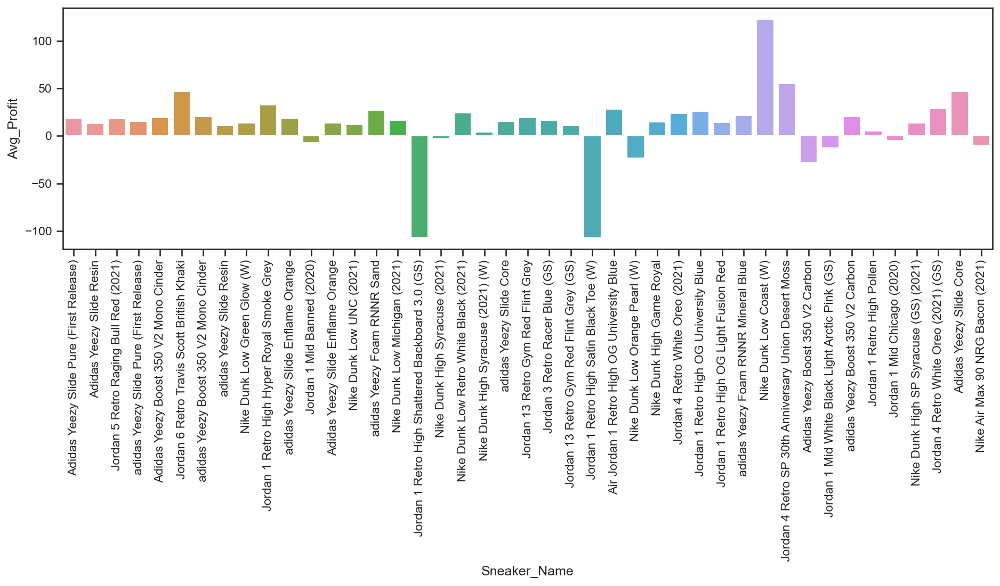

In [92]:
# Analyze trend between Sneaker Name & Sale price
# Create average retail price df

# Creating visual of average shoe price
fig_dims = (15, 4)
fig, ax = plt.subplots(figsize=fig_dims)
chart = sns.barplot(x = profit['Sneaker_Name'][:43], y = profit['Avg_Profit'])
chart.set_xticklabels(chart.get_xticklabels(), rotation = 90)
plt.gca().xaxis.set_major_locator(plt.MultipleLocator(1))

In [34]:
# Find average profit by brand
avgs_2 = []
bds = df[['Brand','Profit USD']]
brands = ['Nike Off White ','Adidas Yeezy ','Jordan','Nike','Nike Travis Scott','Nike Union LA']
for brand in brands:
    brandrow = bds.loc[bds['Brand'] == str(brand)]
    avgs_2.append(brandrow['Profit USD'].mean())
print('Nike Off White average profit: $' + str(avgs_2[0]))
print('Adidas Yeezy average profit: $' + str(avgs_2[1]))
print('Jordan average profit: $' + str(avgs_2[2]))
print('Nike average profit: $' + str(avgs_2[3]))
print('Nike Travis Scott average profit: $' + str(avgs_2[4]))
print('Nike Union LA average profit: $' + str(avgs_2[5]))

Nike Off White average profit: $66.04632970721677
Adidas Yeezy average profit: $17.37368947389003
Jordan average profit: $7.887993199740697
Nike average profit: $16.663662914807446
Nike Travis Scott average profit: $42.965363949405706
Nike Union LA average profit: $55.16870462196489


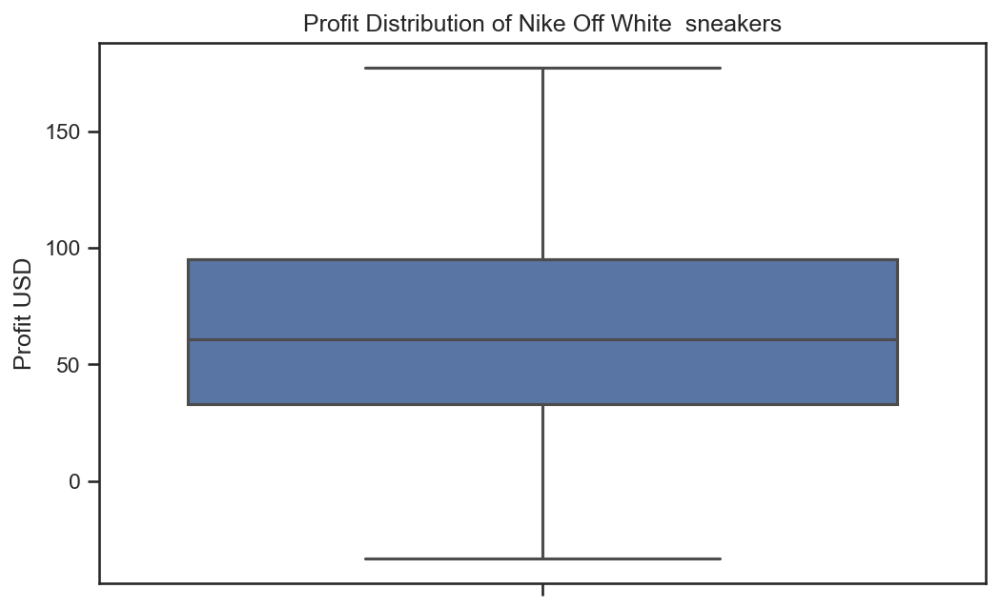

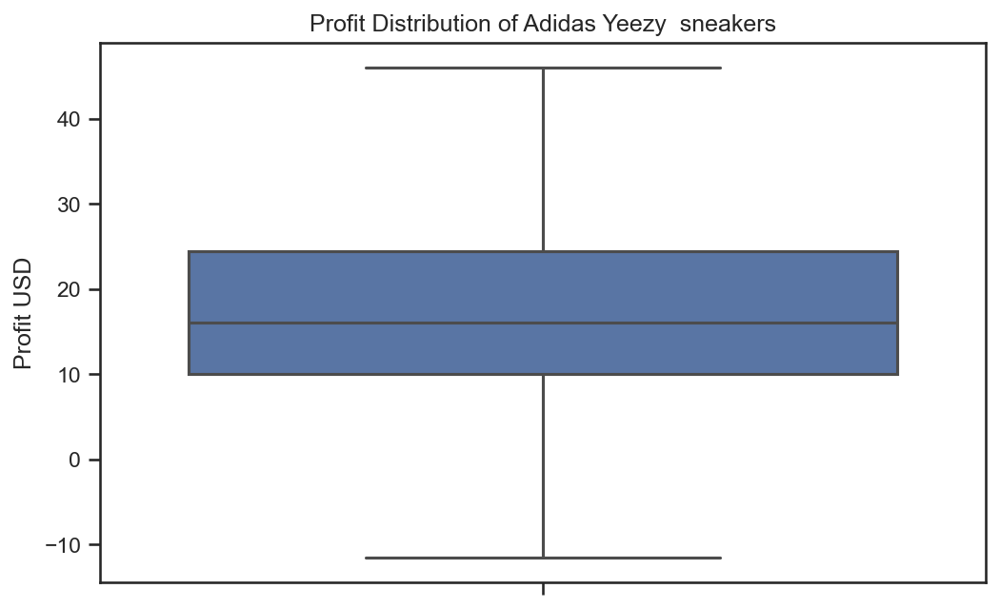

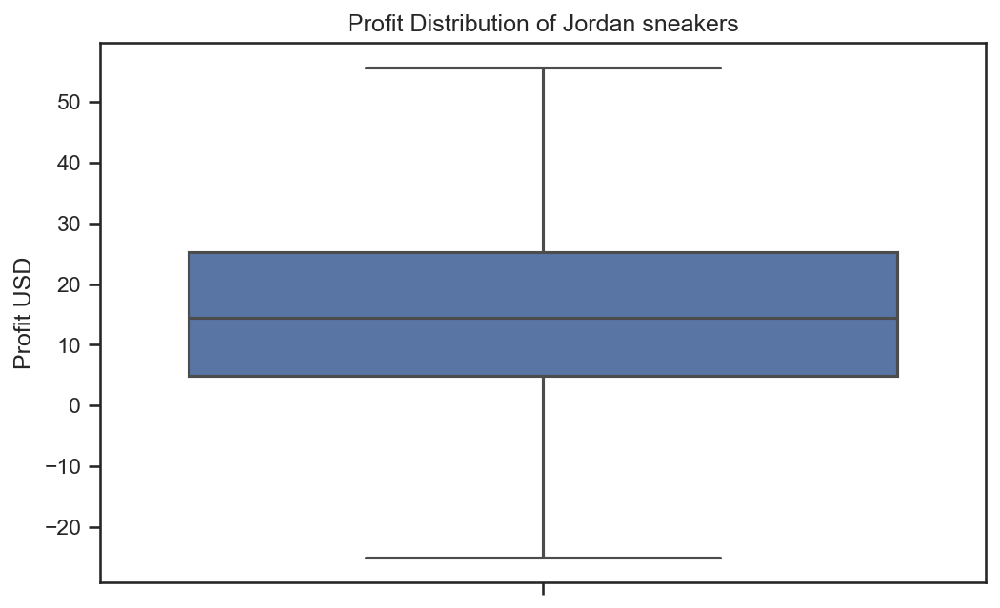

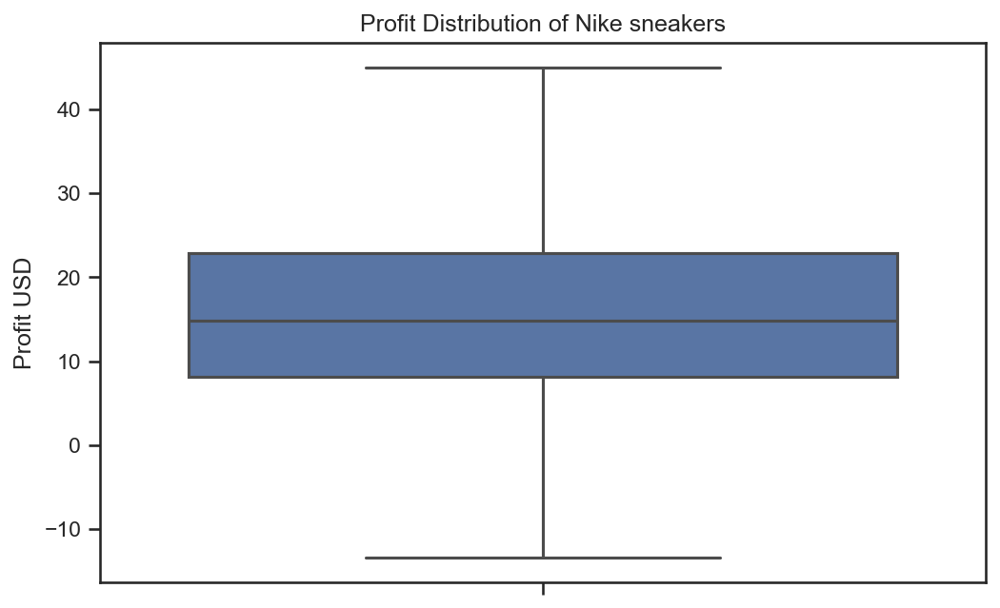

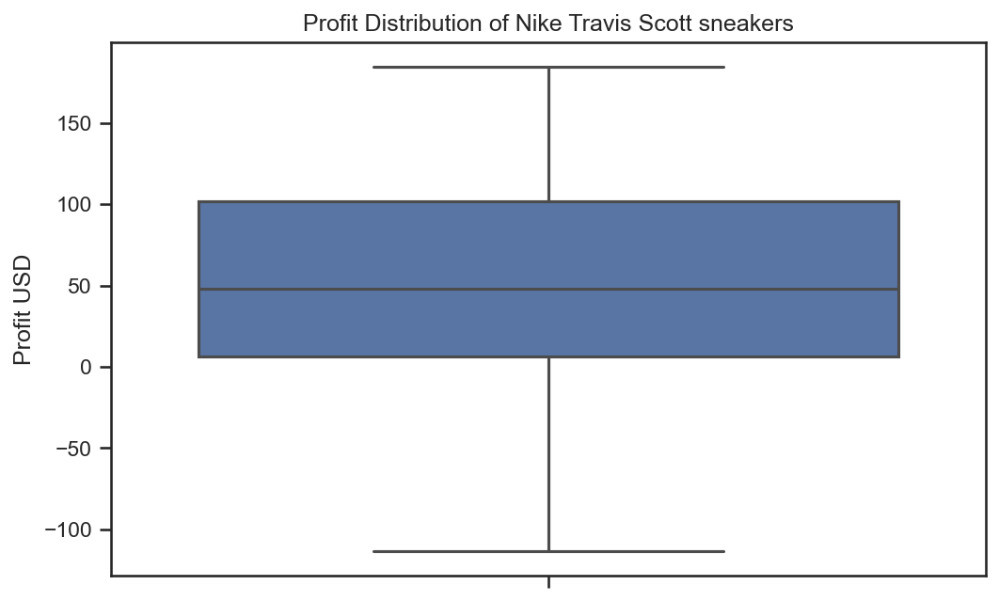

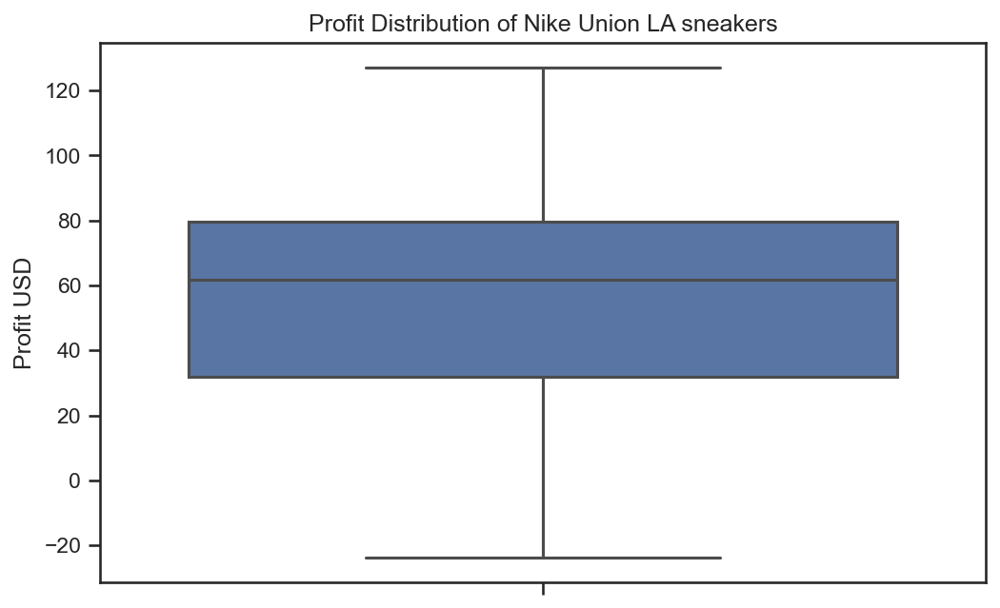

In [35]:
# Create boxplot distribution of sales price by brand
for brand in brands:
    brandrow = bds.loc[bds['Brand'] == str(brand)]
    chart = sns.boxplot(y=brandrow["Profit USD"], showfliers = False)
    chart.set_title("Profit Distribution of %s sneakers" % (brand))
    plt.show()

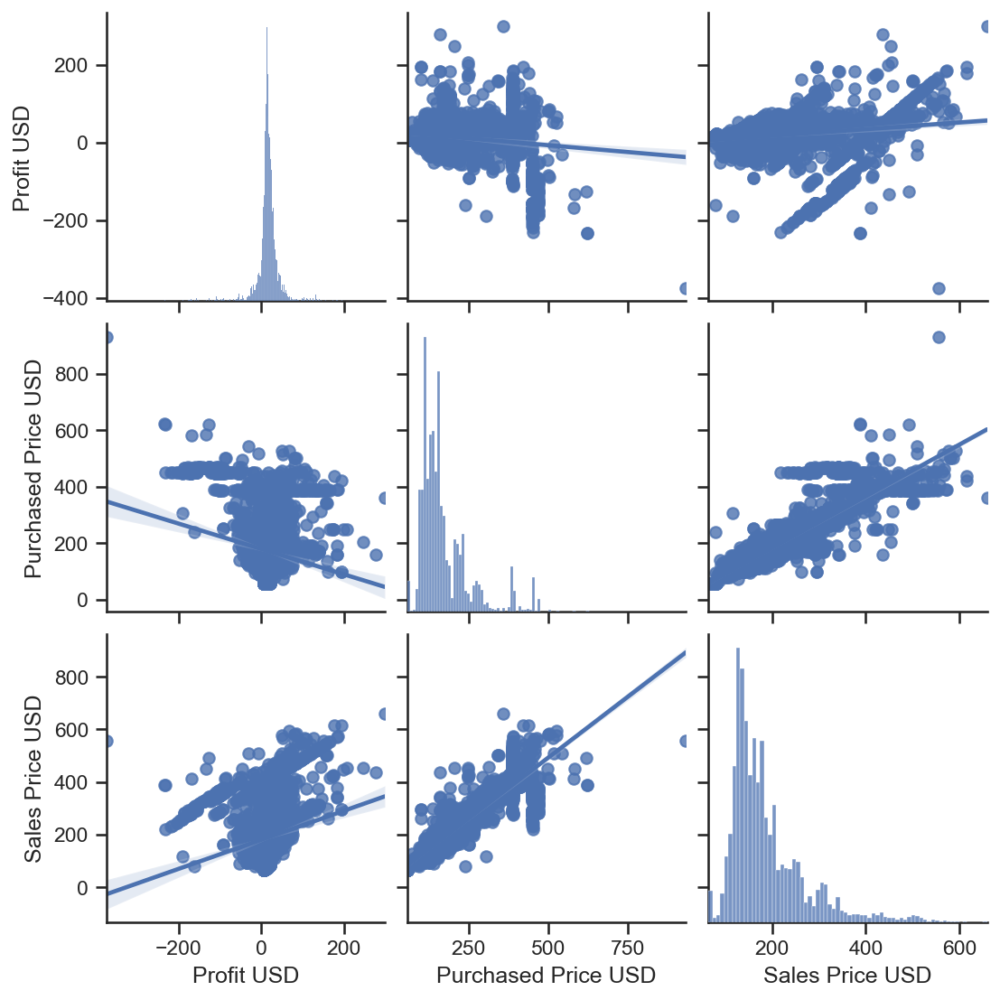

In [36]:
# Plot on Profit, Time Released and Shoe Size
sns.set(style='ticks', color_codes=True)
sns.pairplot(df, vars=['Profit USD', 'Purchased Price USD', 'Sales Price USD'], kind='reg')
plt.show()

In [37]:
# Analyze trend between Sales Price and Order Date
# Find average sale price per day
dts = df[['Sold Date', 'Profit USD']]
uniq_ord_dates = df['Sold Date'].value_counts().index.tolist()
avg_3 = []

for date in uniq_ord_dates:
    daterow = dts.loc[dts['Sold Date'] == str(date)]
    avg_3.append(daterow['Profit USD'].mean())

unq_dates = pd.Series(uniq_ord_dates)
date_avgs = pd.Series(avg_3)
dateprice_df = pd.DataFrame(columns = ['Sold_date', 'Average_Profit'])
dateprice_df['Sold_date'] = unq_dates.sort_values(ascending = True)
dateprice_df['Average_Profit'] = date_avgs
dateprice_df.head()

,Sold_date,Average_Profit
489,2018-05-29,-6.27
477,2018-12-25,-36.70
509,2019-03-28,18.59
466,2019-04-18,22.28
428,2019-04-19,32.16


Text(0.5, 1.0, 'Average Daily Profit Price Over time')

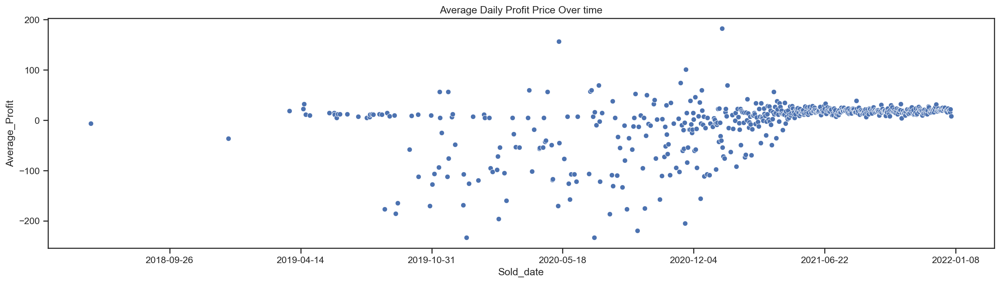

In [38]:
# Create visualization of Average Profit Over time
fig_dims = (20, 5)
fig, ax = plt.subplots(figsize=fig_dims)
chart = sns.scatterplot(x="Sold_date", y="Average_Profit", data=dateprice_df)
plt.gca().xaxis.set_major_locator(plt.MultipleLocator(200))
chart.set_title("Average Daily Profit Price Over time")

In [39]:
# Finding Average Sale Price on Release Dates Over Time
dts = df[['Release Date', 'Profit USD']]
uniq_rel_dates = df['Release Date'].value_counts().index.tolist()
avg_4 = []

for date in uniq_rel_dates:
    daterow = dts.loc[dts['Release Date'] == str(date)]
    avg_4.append(daterow['Profit USD'].mean())

unq_dates = pd.Series(uniq_rel_dates)
date_avgs = pd.Series(avg_4)
dateprice_df_2 = pd.DataFrame(columns = ['Release_date', 'Average_Profit'])
dateprice_df_2['Release_date'] = unq_dates.sort_values(ascending = True)
dateprice_df_2['Average_Profit'] = date_avgs
dateprice_df_2.head()

,Release_date,Average_Profit
67,2016-07-01,-49.47
51,2017-02-11,-11.07
56,2018-04-14,32.53
66,2019-02-15,156.56
77,2019-02-23,-57.96


Text(0.5, 1.0, 'Average Daily Profit Over time')

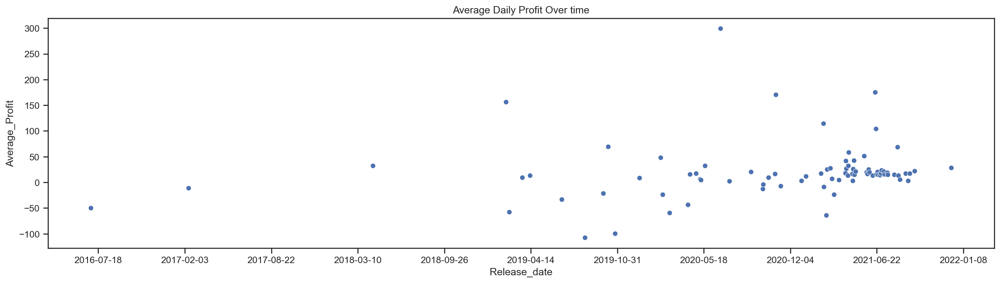

In [40]:
# Create visualization of Average Sale Price Over time
fig_dims = (20, 5)
fig, ax = plt.subplots(figsize=fig_dims)
chart = sns.scatterplot(x="Release_date", y="Average_Profit", data=dateprice_df_2)
plt.gca().xaxis.set_major_locator(plt.MultipleLocator(200))
chart.set_title("Average Daily Profit Over time")

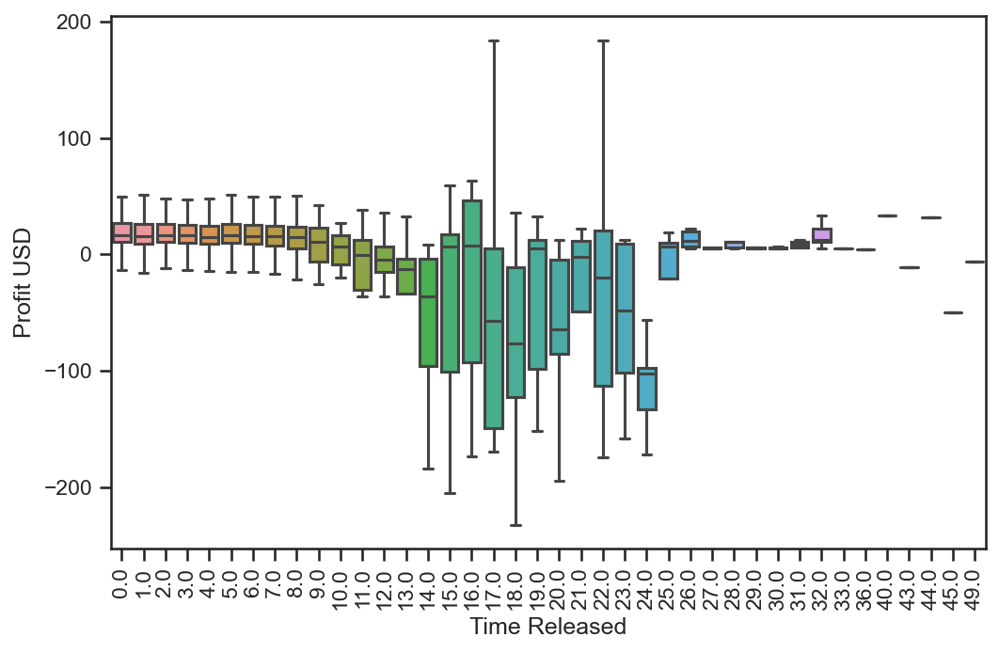

In [41]:
# Create boxplot on Time Released and Profit 
ax = sns.boxplot(data=df, x='Time Released', y='Profit USD', showfliers = False)
ax.set_xticklabels(ax.get_xticklabels(),rotation=90)
plt.show()

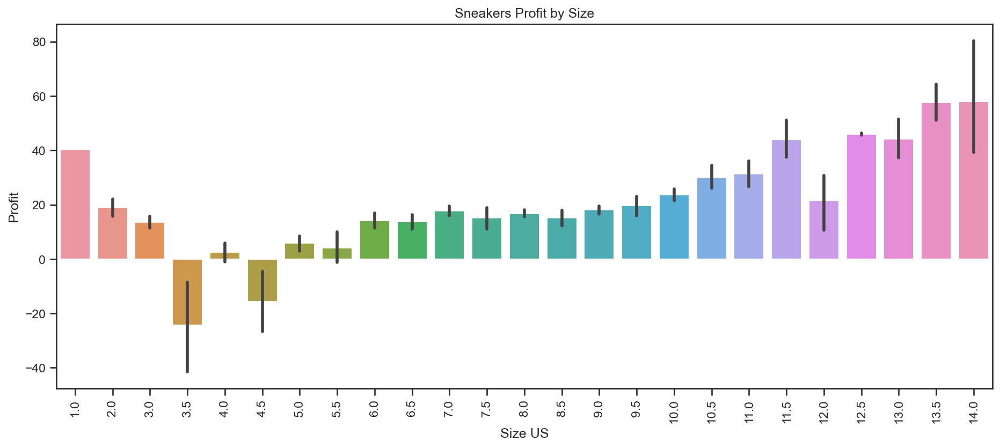

In [42]:
# Create barchart on Size and Profit 
plt.figure(figsize=(15,6))
chart1=sns.barplot(x = 'Size US', y= 'Profit USD', data = df)
chart1.set_title("Sneakers Profit by Size" )
plt.ylabel("Profit")
chart1.set_xticklabels(chart1.get_xticklabels(), rotation = 90)
plt.gca().xaxis.set_major_locator(plt.MultipleLocator(1))
plt.show(15)

In [43]:
import altair as alt

alt.data_transformers.disable_max_rows()

source = df

alt.Chart(df).mark_circle(size=60).encode(
    x='Size US',
    y='Profit USD',
    color='Brand',
    tooltip=['Brand','Sneaker Name',
             'Purchased Price USD','Sales Price USD']).interactive()

alt.Chart(...)

In [44]:
# Renaming columns to get rid of spaces
df = df.rename(columns={
    "Sneaker Name": "Sneaker_Name",
    "Sales Price USD": "Sale_Price",
    "Retail Price": "Retail_Price",
    "Purchased Price USD": "Purchased_Price",
    "Profit USD": "Profit",
    "Time Released": "Time_Released",
    "Size US": "Shoe_Size",
    })

In [45]:
#import necessary libraries 
import matplotlib.pyplot as plt
import statsmodels.api as sm
from statsmodels.formula.api import ols

#fit simple linear regression model
model = ols('Profit ~ Sneaker_Name + Brand + Purchased_Price', data=df).fit()

#view model summary
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:                 Profit   R-squared:                       0.585
Model:                            OLS   Adj. R-squared:                  0.577
Method:                 Least Squares   F-statistic:                     73.94
Date:                Mon, 09 May 2022   Prob (F-statistic):               0.00
Time:                        17:14:09   Log-Likelihood:                -34029.
No. Observations:                7641   AIC:                         6.835e+04
Df Residuals:                    7497   BIC:                         6.934e+04
Df Model:                         143                                         
Covariance Type:            nonrobust                                         
                                                                              coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------

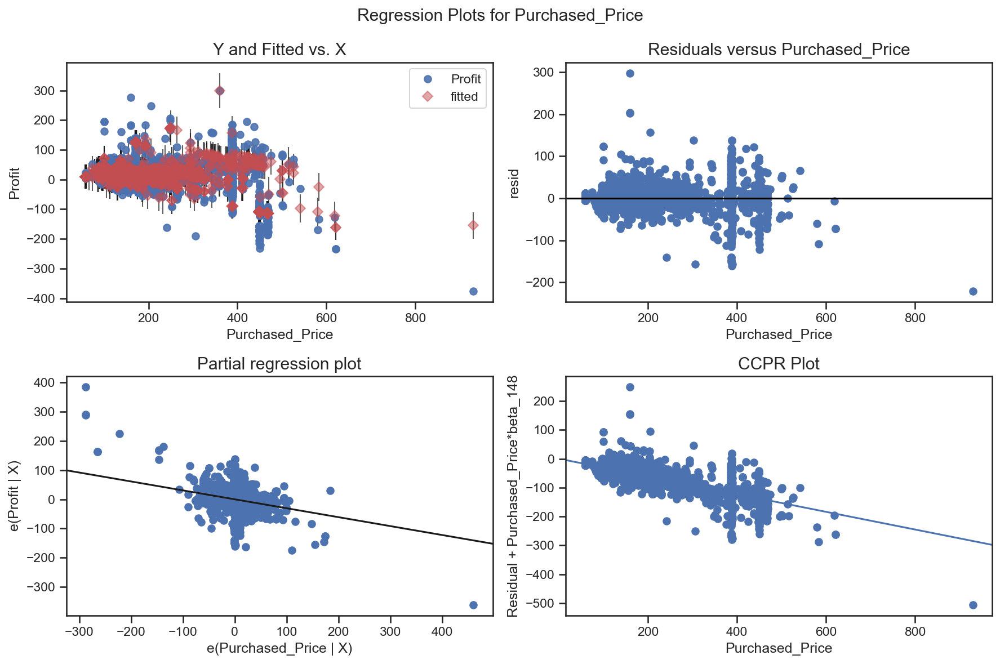

In [46]:
#create residual vs. predictor plot for 'assists'
fig = plt.figure(figsize=(12,8))
fig = sm.graphics.plot_regress_exog(model, 'Purchased_Price', fig=fig)

In [47]:
#fit multiple linear regression model
model1 = ols('Profit ~  Purchased_Price+ Shoe_Size + Time_Released +Sneaker_Name', data=df).fit()

#view model summary
print(model1.summary())

                            OLS Regression Results                            
Dep. Variable:                 Profit   R-squared:                       0.708
Model:                            OLS   Adj. R-squared:                  0.701
Method:                 Least Squares   F-statistic:                     107.9
Date:                Mon, 09 May 2022   Prob (F-statistic):               0.00
Time:                        17:14:10   Log-Likelihood:                -32686.
No. Observations:                7641   AIC:                         6.571e+04
Df Residuals:                    7472   BIC:                         6.688e+04
Df Model:                         168                                         
Covariance Type:            nonrobust                                         
                                                                              coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------

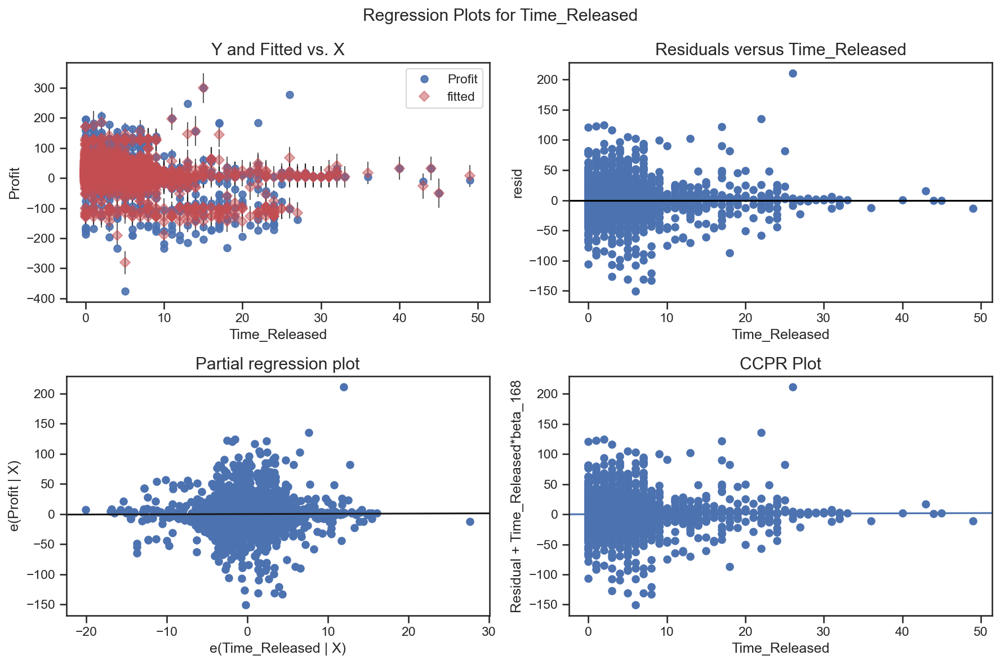

In [48]:
#create residual vs. predictor plot for 'assists'
fig = plt.figure(figsize=(12,8))
fig = sm.graphics.plot_regress_exog(model1, 'Time_Released', fig=fig)

In [49]:
import scipy.stats as stats

fvalue, pvalue = stats.f_oneway(df[''], df['B'], df['C'], df['D'])
print(fvalue, pvalue)
            

KeyError: False

# Model #1



In [47]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn import preprocessing

In [48]:
# Create features and target variables
features = ['Time_Released', 'Purchased_Price']
target = 'Profit'
X = df[features]
y = df[target]

In [49]:
# Get dummies varibles
X = pd.get_dummies(X)

In [50]:
# Split to training and testing
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size= 0.3, random_state = 42)

In [51]:
sc = preprocessing.StandardScaler()

X_train_std = sc.fit_transform(X_train)
X_test_std = sc.transform (X_test)

In [52]:
# Linear Regression
regressor = LinearRegression()

regressor.fit(X_train_std, y_train)

LinearRegression()

In [53]:
# Regression score
regressor.score(X_test_std, y_test)

0.050819225552751646

In [54]:
# Actual and Predict price

y_pred = regressor.predict(X_test_std)

evaluate = pd.DataFrame({'Actual': y_test.values.flatten(), 'Predicted': y_pred.flatten()})
evaluate.head(10)

,Actual,Predicted
0,17.01,21.31
1,4.66,8.16
2,27.48,23.75
3,5.52,21.87
4,26.61,10.41
5,43.58,12.12
6,31.18,25.88
7,9.67,15.71
8,11.25,16.10
9,9.81,18.56


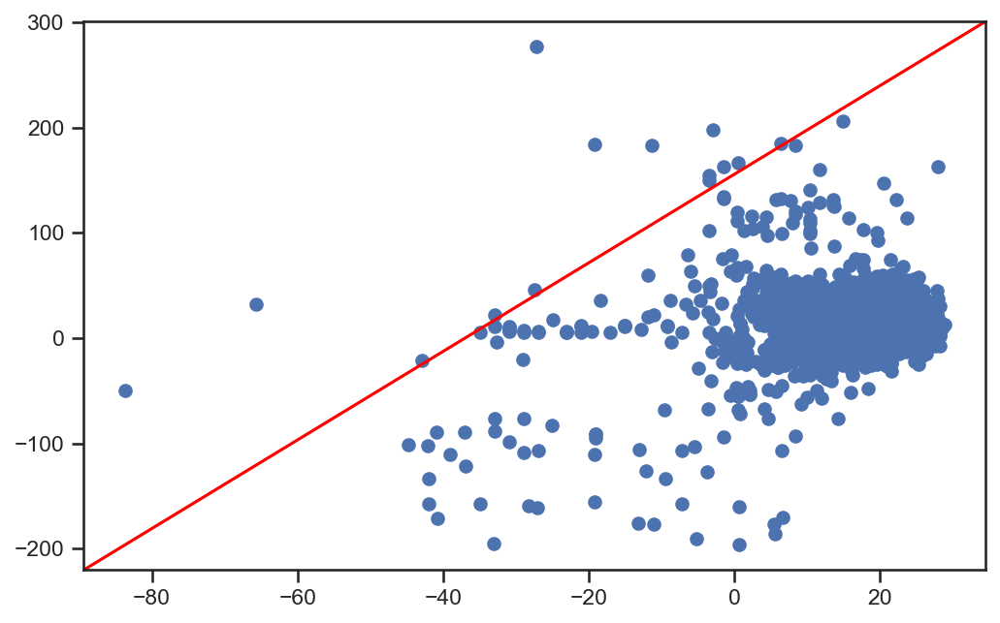

In [67]:
# Plot the data
x = evaluate['Predicted']
y = evaluate['Actual']
fig, ax = plt.subplots()
line = mlines.Line2D([0, 1], [0, 1], color='red')
transform = ax.transAxes
line.set_transform(transform)
ax.add_line(line)
ax.scatter(x, y)
plt.show()

In [114]:
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
# R2 Score
print(f"R2 score: {r2_score(y_test, y_pred)}")
# Mean Absolute Error (MAE)
print(f"MAE score: {mean_absolute_error(y_test, y_pred)}")
# Mean Squared Error (MSE)
print(f"MSE score: {mean_squared_error(y_test, y_pred)}")

R2 score: 0.050819225552751646
MAE score: 17.916456543901802
MSE score: 986.8874481746409


# Model #2

In [93]:
# Create features and target variables

features = ['Time_Released','Sale_Price']
target = 'Profit'

X = df[features]
y = df[target]

In [94]:
X = pd.get_dummies(X)

In [96]:
# Split to training and testing
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size= 0.3, random_state = 42)

sc = preprocessing.StandardScaler()

X_train_std = sc.fit_transform(X_train)
X_test_std = sc.transform (X_test)

regressor = LinearRegression()

regressor.fit(X_train_std, y_train)

LinearRegression()

In [97]:
# Linear regression score 
regressor.score(X_test_std, y_test)

0.06841915590789704

In [98]:
# Actual vs. Predicted
y_pred = regressor.predict(X_test_std)

evaluate = pd.DataFrame({'Actual': y_test.values.flatten(), 'Predicted': y_pred.flatten()})
evaluate.head(10)

,Actual,Predicted
0,17.01,12.36
1,4.66,15.12
2,27.48,25.01
3,5.52,15.61
4,26.61,44.34
5,43.58,22.99
6,31.18,17.14
7,9.67,14.77
8,11.25,24.52
9,9.81,10.63


<AxesSubplot:>

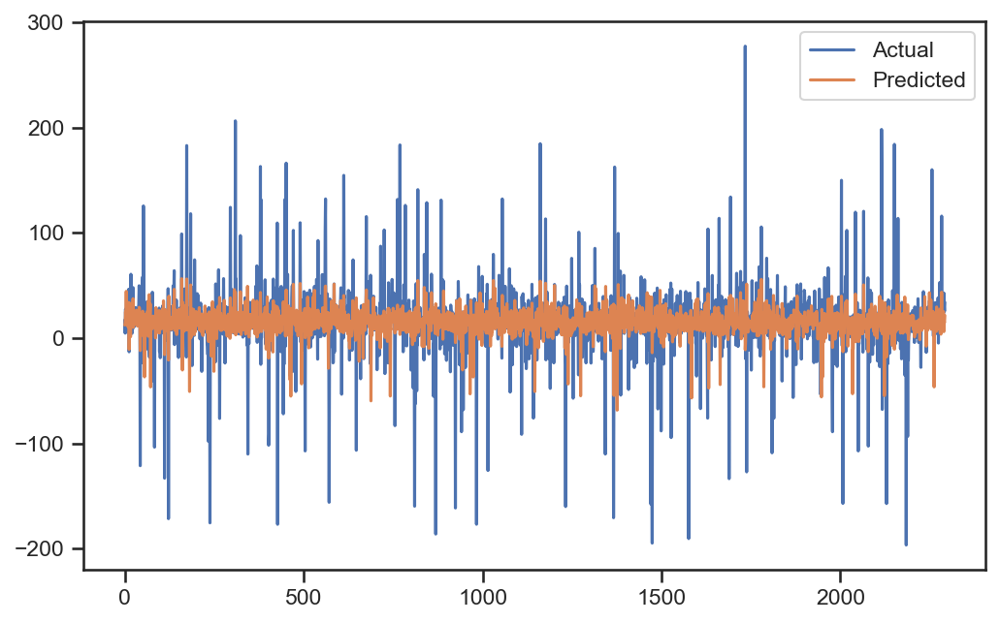

In [102]:
evaluate.plot(kind = 'line')

In [103]:
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
# R2 Score
print(f"R2 score: {r2_score(y_test, y_pred)}")
# Mean Absolute Error (MAE)
print(f"MAE score: {mean_absolute_error(y_test, y_pred)}")
# Mean Squared Error (MSE)
print(f"MSE score: {mean_squared_error(y_test, y_pred)}")

R2 score: 0.06841915590789704
MAE score: 16.800048161411993
MSE score: 968.5883519183395
